In [72]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib import colors
pd.__version__

'0.25.3'

In [73]:
# from rpy2.robjects import r, pandas2ri

# pandas2ri.activate()

In [74]:
# import rpy2.rinterface_lib.callbacks
# import logging

# from rpy2.robjects import pandas2ri
# import anndata2ri

In [75]:


# # Ignore R warning messages
# #Note: this can be commented out to get more verbose R output
# rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# # Automatically convert rpy2 outputs to pandas dataframes
# pandas2ri.activate()
# anndata2ri.activate()
# %load_ext rpy2.ipython

In [76]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=180,  frameon=False, figsize=(5, 5))

scanpy==1.4.5 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.4 scipy==1.4.1 pandas==0.25.3 scikit-learn==0.22.1 statsmodels==0.11.0rc1 python-igraph==0.7.1+4.bed07760 louvain==0.6.1


In [77]:
epi = sc.read('../data/epi.h5ad')

In [78]:
epi.obs.batch.value_counts()

WT            4034
Repdose       1931
Singledose    1734
Name: batch, dtype: int64

In [79]:
epi.obs

,batch,n_genes,percent_mito,n_counts,leiden_r1.0,louvain_r1.0,leiden_adata_clusters
index,,,,,,,
AAACCTGCATGTCGAT-WT,WT,1819,0.030933,5934.871582,0,0,Epithelial cells
AAACCTGTCACCTCGT-WT,WT,1758,0.042098,5314.225586,0,0,Epithelial cells
AAACCTGTCCACGCAG-WT,WT,2620,0.036597,5943.985840,2,2,Epithelial cells
AAACCTGTCCCAAGTA-WT,WT,1771,0.025849,5713.408203,0,0,Epithelial cells
AAACCTGTCTCTAGGA-WT,WT,1826,0.042839,6809.791016,0,0,Epithelial cells
...,...,...,...,...,...,...,...
TTTGTCAAGTACGCGA-Repdose,Repdose,2995,0.053804,19143.015625,7,9,Epithelial cells
TTTGTCACACAGGAGT-Repdose,Repdose,2179,0.032025,5995.936523,14,14,Epithelial cells
TTTGTCACACCATCCT-Repdose,Repdose,2499,0.064488,6121.461426,3,8,Epithelial cells


In [80]:
#sc.pp.highly_variable_genes(epi, min_mean=0.0125, max_mean=3, min_disp=0.5)

In [81]:
epi.var[epi.var.highly_variable==True].shape

(3008, 7)

In [82]:
#sc.pp.regress_out(epi, ['n_counts', 'percent_mito'])

In [83]:
epi.raw = epi

In [84]:
#sc.pp.scale(epi, max_value=10)

In [85]:
#sc.tl.pca(epi, svd_solver='arpack', n_comps=25)

In [86]:
#sc.pl.pca(epi, color='Sftpc', use_raw=True, show=False, ncols= 2,color_map = 'Blues');

In [87]:
#sc.pl.pca_variance_ratio(epi, log=True)

In [88]:
#epi.write('../data/epi.h5ad')

In [89]:
epi

AnnData object with n_obs × n_vars = 7699 × 19924 
    obs: 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden_r1.0', 'louvain_r1.0', 'leiden_adata_clusters'
    var: 'gene_ids', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_counts'
    uns: 'batch_colors', 'leiden', 'leiden_adata_clusters_colors', 'leiden_r1.0_colors', 'louvain', 'louvain_r1.0_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [90]:
sc.pp.neighbors(epi, n_neighbors= 20 )
sc.tl.umap(epi, random_state=1, n_components=2)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


In [91]:
sc.tl.louvain(epi, resolution= 1.0, key_added = 'louvain_epi_r1.0')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 15 clusters and added
    'louvain_epi_r1.0', the cluster labels (adata.obs, categorical) (0:00:01)


In [92]:
sc.tl.leiden(epi,  resolution= 1.0, key_added = 'leiden_epi_r1.0')

running Leiden clustering
    finished: found 16 clusters and added
    'leiden_epi_r1.0', the cluster labels (adata.obs, categorical) (0:00:01)


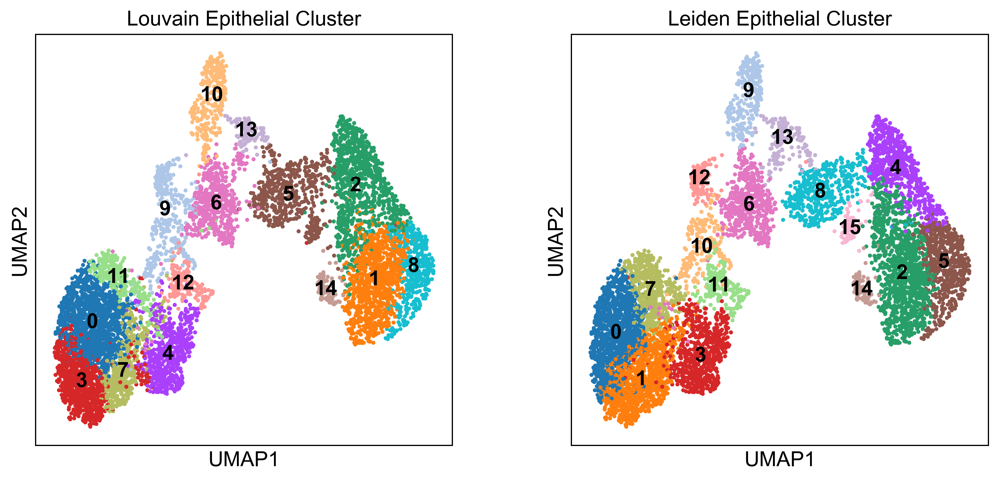

In [93]:
sc.pl.umap(epi, color=['louvain_epi_r1.0','leiden_epi_r1.0'], title=['Louvain Epithelial Cluster','Leiden Epithelial Cluster'], frameon = True, s= 30, alpha = 1, ncols = 2, legend_loc = 'on data', save ='_epi_louvai_leiden_compare.pdf')

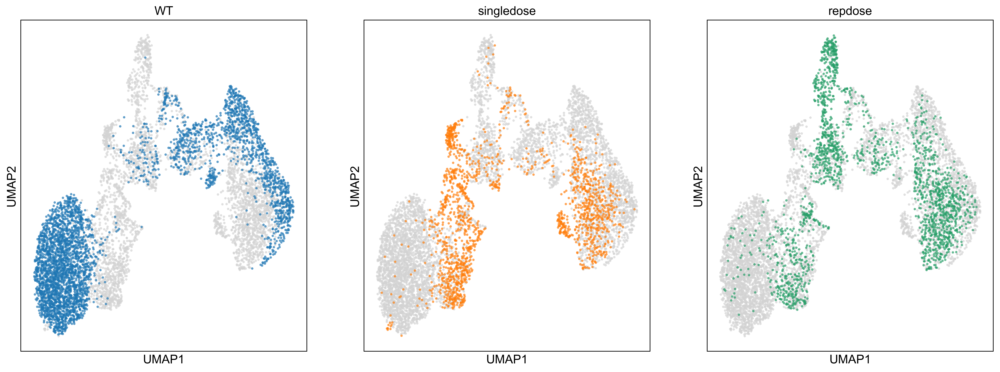

In [135]:
fig, ax =plt.subplots(ncols=3, figsize=(20,7))
sc.pl.umap(epi, color=['batch'],groups='WT', title= 'WT',frameon = True, s= 30, alpha = 0.7, ncols = 2,legend_loc="", ax=ax[0], show= False)
sc.pl.umap(epi, color=['batch'], groups='Singledose',title= 'singledose', frameon = True, s= 30, alpha = 0.7,legend_loc="", ncols = 2, ax=ax[1], show = False)
sc.pl.umap(epi, color=['batch'], groups='Repdose', title= 'repdose',frameon = True, s= 30, alpha = 0.7, legend_loc="",ncols = 2, ax=ax[2], show= False)
fig.savefig("./figures/groups_clusters.pdf", dpi=300,bbox_inches='tight')


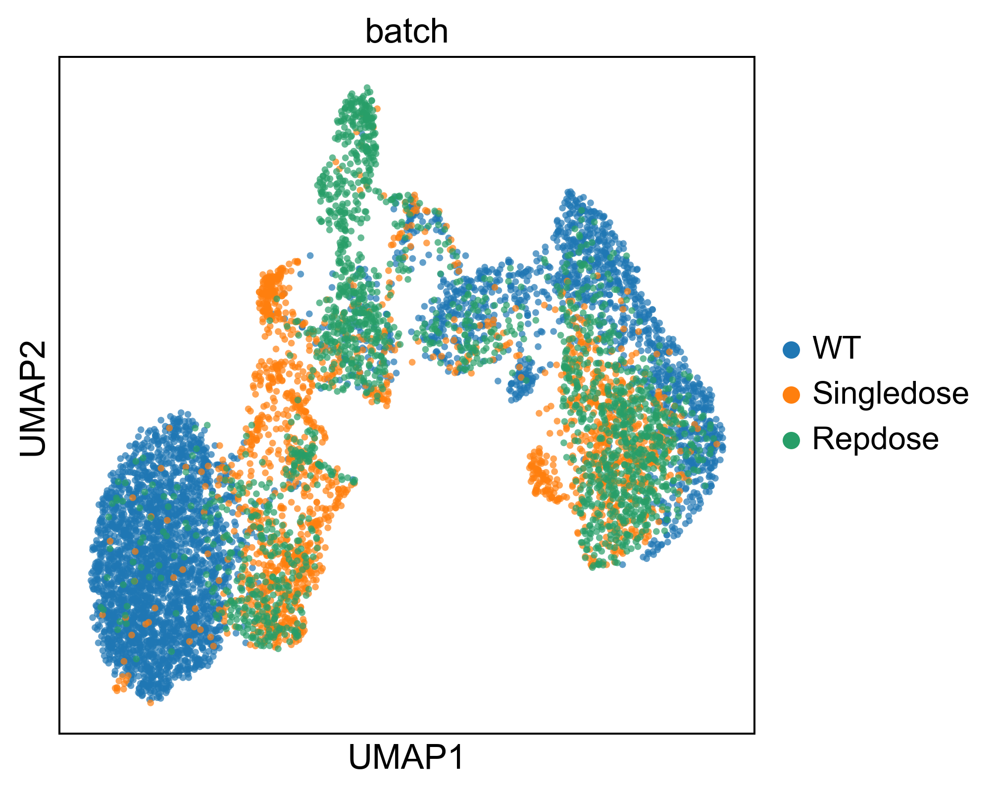

In [95]:
sc.pl.umap(epi, color=['batch'], groups=['WT','Singledose','Repdose'], frameon = True, s= 30, alpha = 0.7, ncols = 2, save = '_epi_groups.pdf')

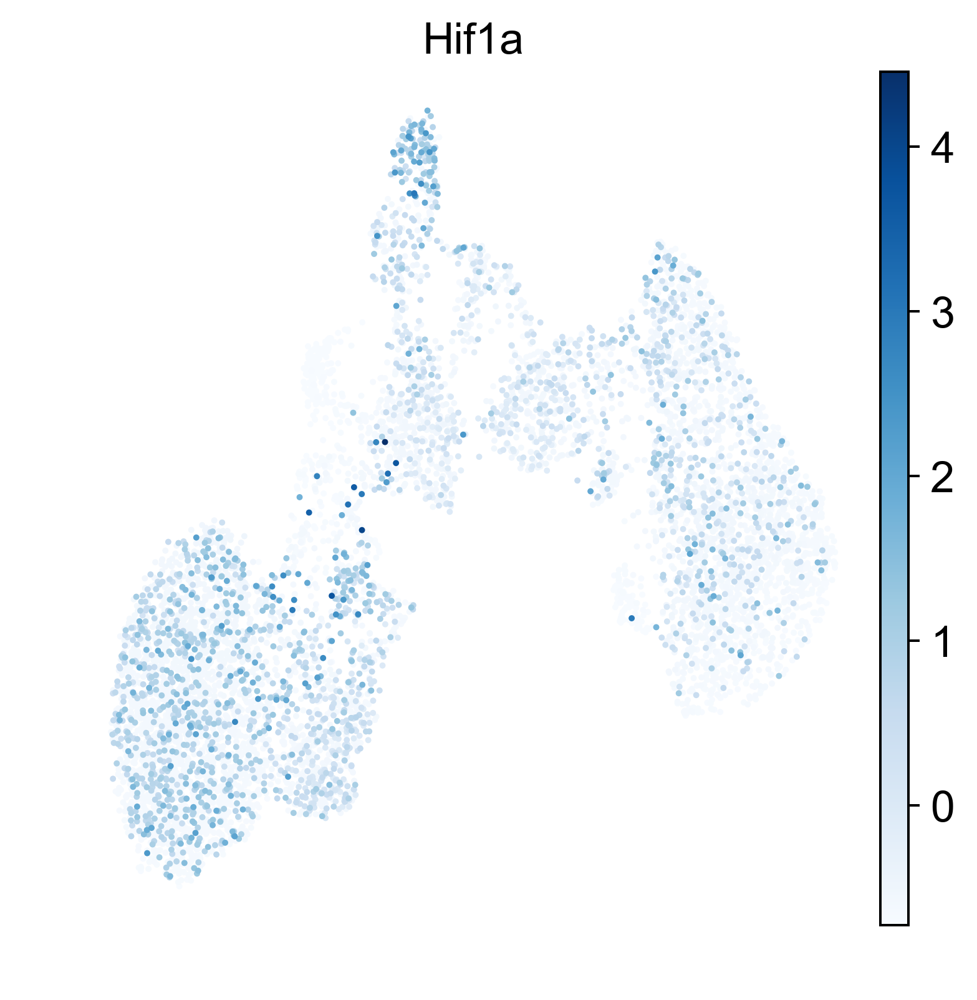

In [96]:
sc.pl.umap(epi,color =["Hif1a"], ncols= 2,color_map = 'Blues');

In [97]:
sc.pl.umap(epi,color =["Sftpc","Rtkn2","Foxj1",
                        "Scgb1a1", 'Hif1a','Krt5', 'Epas1','Hopx'], use_raw=True, show=False, ncols= 2,color_map = 'Blues', save = '_epi1.pdf');

In [98]:
epi.obs

,batch,n_genes,percent_mito,n_counts,leiden_r1.0,louvain_r1.0,leiden_adata_clusters,louvain_epi_r1.0,leiden_epi_r1.0
index,,,,,,,,,
AAACCTGCATGTCGAT-WT,WT,1819,0.030933,5934.871582,0,0,Epithelial cells,7,1
AAACCTGTCACCTCGT-WT,WT,1758,0.042098,5314.225586,0,0,Epithelial cells,0,0
AAACCTGTCCACGCAG-WT,WT,2620,0.036597,5943.985840,2,2,Epithelial cells,8,5
AAACCTGTCCCAAGTA-WT,WT,1771,0.025849,5713.408203,0,0,Epithelial cells,7,1
AAACCTGTCTCTAGGA-WT,WT,1826,0.042839,6809.791016,0,0,Epithelial cells,0,1
...,...,...,...,...,...,...,...,...,...
TTTGTCAAGTACGCGA-Repdose,Repdose,2995,0.053804,19143.015625,7,9,Epithelial cells,6,6
TTTGTCACACAGGAGT-Repdose,Repdose,2179,0.032025,5995.936523,14,14,Epithelial cells,10,9
TTTGTCACACCATCCT-Repdose,Repdose,2499,0.064488,6121.461426,3,8,Epithelial cells,2,4


ranking genes


C:\Users\tanjorh\.conda\envs\singlecellanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:252: RuntimeWarning: invalid value encountered in log2
  rankings_gene_logfoldchanges.append(np.log2(foldchanges[global_indices]))


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:10)


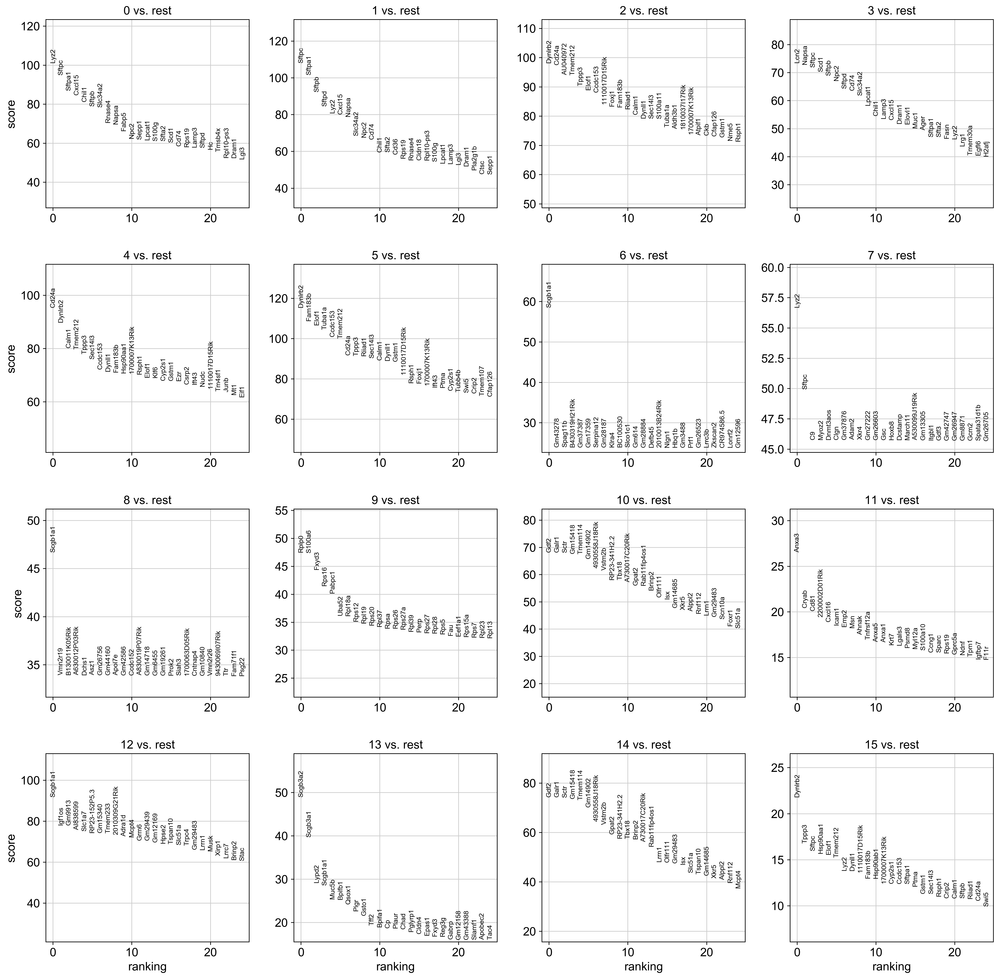

In [99]:
sc.tl.rank_genes_groups(epi, 'leiden_epi_r1.0', method='t-test')
sc.pl.rank_genes_groups(epi, n_genes=25, sharey=False)

In [100]:
#epi

In [101]:
#sum(epi.obs.n_genes <1)

In [102]:
#sc.settings.verbosity = 2

In [103]:
epi.obs

,batch,n_genes,percent_mito,n_counts,leiden_r1.0,louvain_r1.0,leiden_adata_clusters,louvain_epi_r1.0,leiden_epi_r1.0
index,,,,,,,,,
AAACCTGCATGTCGAT-WT,WT,1819,0.030933,5934.871582,0,0,Epithelial cells,7,1
AAACCTGTCACCTCGT-WT,WT,1758,0.042098,5314.225586,0,0,Epithelial cells,0,0
AAACCTGTCCACGCAG-WT,WT,2620,0.036597,5943.985840,2,2,Epithelial cells,8,5
AAACCTGTCCCAAGTA-WT,WT,1771,0.025849,5713.408203,0,0,Epithelial cells,7,1
AAACCTGTCTCTAGGA-WT,WT,1826,0.042839,6809.791016,0,0,Epithelial cells,0,1
...,...,...,...,...,...,...,...,...,...
TTTGTCAAGTACGCGA-Repdose,Repdose,2995,0.053804,19143.015625,7,9,Epithelial cells,6,6
TTTGTCACACAGGAGT-Repdose,Repdose,2179,0.032025,5995.936523,14,14,Epithelial cells,10,9
TTTGTCACACCATCCT-Repdose,Repdose,2499,0.064488,6121.461426,3,8,Epithelial cells,2,4


In [104]:
#sc.tl.rank_genes_groups(epi, 'leiden_epi_r1.0', method='wilcoxon')
#sc.pl.rank_genes_groups(epi, n_genes=25, sharey=False)

In [105]:
epi.write('../data/epi_final.h5ad')

In [106]:
epi = sc.read('../data/epi_final.h5ad')

In [107]:
epi

AnnData object with n_obs × n_vars = 7699 × 19924 
    obs: 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden_r1.0', 'louvain_r1.0', 'leiden_adata_clusters', 'louvain_epi_r1.0', 'leiden_epi_r1.0'
    var: 'gene_ids', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_counts'
    uns: 'batch_colors', 'leiden', 'leiden_adata_clusters_colors', 'leiden_epi_r1.0_colors', 'leiden_r1.0_colors', 'louvain', 'louvain_epi_r1.0_colors', 'louvain_r1.0_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [108]:
pd.DataFrame(epi.uns['rank_genes_groups']['names']).head(5)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,Lyz2,Sftpc,Dynlrb2,Lcn2,Cd24a,Dynlrb2,Scgb1a1,Lyz2,Scgb1a1,Rplp0,Gdf2,Anxa3,Scgb1a1,Scgb3a2,Gdf2,Dynlrb2
1,Sftpc,Sftpa1,Cd24a,Napsa,Dynlrb2,Fam183b,Gm43278,Sftpc,Vmn2r19,S100a6,Galr1,Cryab,Igf1os,Scgb3a1,Galr1,Tppp3
2,Sftpa1,Sftpb,AU040972,Sftpc,Calm1,Elof1,Spag11b,C9,B130011K05Rik,Fxyd3,Sctr,Cd81,Gm9913,Lypd2,Sctr,Sftpc
3,Cxcl15,Sftpd,Tmem212,Scd1,Tmem212,Tuba1a,B430319H21Rik,Myoz2,A630012P03Rik,Rps16,Gm15418,2200002D01Rik,AI838599,Scgb1a1,Gm15418,Hsp90aa1
4,Chil1,Lyz2,Tppp3,Sftpb,Tppp3,Ccdc153,Gm37387,Dnmt3aos,Dchs1,Pabpc1,Tmem114,Cxcl16,Slc1a7,Muc5b,Tmem114,Elof1


In [109]:
result = epi.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(5)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,...,11_n,11_p,12_n,12_p,13_n,13_p,14_n,14_p,15_n,15_p
0,Lyz2,0.0,Sftpc,0.0,Dynlrb2,0.0,Lcn2,0.0,Cd24a,0.0,...,Anxa3,4.952214e-69,Scgb1a1,4.481713e-172,Scgb3a2,5.355262e-106,Gdf2,7.056214e-181,Dynlrb2,1.178766e-38
1,Sftpc,0.0,Sftpa1,0.0,Cd24a,0.0,Napsa,0.0,Dynlrb2,0.0,...,Cryab,3.133490e-51,Igf1os,7.024769e-173,Scgb3a1,7.307548e-88,Galr1,1.383606e-180,Tppp3,6.919445e-29
2,Sftpa1,0.0,Sftpb,0.0,AU040972,0.0,Sftpc,0.0,Calm1,0.0,...,Cd81,1.232508e-50,Gm9913,9.642719e-175,Lypd2,1.541996e-68,Sctr,3.139268e-178,Sftpc,1.075094e-27
3,Cxcl15,0.0,Sftpd,0.0,Tmem212,0.0,Scd1,0.0,Tmem212,0.0,...,2200002D01Rik,2.902621e-48,AI838599,1.187467e-167,Scgb1a1,2.228220e-69,Gm15418,6.600805e-173,Hsp90aa1,3.399050e-27
4,Chil1,0.0,Lyz2,0.0,Tppp3,0.0,Sftpb,0.0,Tppp3,0.0,...,Cxcl16,7.093703e-47,Slc1a7,4.030035e-175,Muc5b,1.205973e-59,Tmem114,1.122277e-191,Elof1,2.575511e-27


In [110]:
epi.shape

(7699, 19924)

In [111]:
epi.var[epi.var.highly_variable == True].sort_values(by='n_cells', ascending = False)

,gene_ids,n_cells,highly_variable,means,dispersions,dispersions_norm,n_counts
index,,,,,,,
Cd9,Cd9,13687,True,2.536841,3.351237,0.557751,26409.642578
Cst3,Cst3,13465,True,2.845150,5.271575,1.827158,24039.939453
Junb,Junb,13084,True,2.457799,3.365970,0.574487,24338.640625
Lars2,Lars2,12043,True,2.395348,4.715790,2.107792,19237.130859
Crip1,Crip1,11675,True,2.802964,4.044163,0.858974,24025.429688
...,...,...,...,...,...,...,...
Il4,Il4,14,True,0.012733,4.574903,6.248541,23.045692
Prss34,Prss34,13,True,0.058990,6.749621,10.064389,13.043963
BC100530,BC100530,13,True,0.014087,3.370317,4.134924,29.936520


In [112]:
epi.var[epi.var.gene_ids== 'Krt5'].sort_values(by='n_cells', ascending = False)

,gene_ids,n_cells,highly_variable,means,dispersions,dispersions_norm,n_counts
index,,,,,,,
Krt5,Krt5,246,True,0.174917,3.189557,3.817756,481.97113


In [113]:
#sc.pl.rank_genes_groups_violin(epi,n_genes=8)

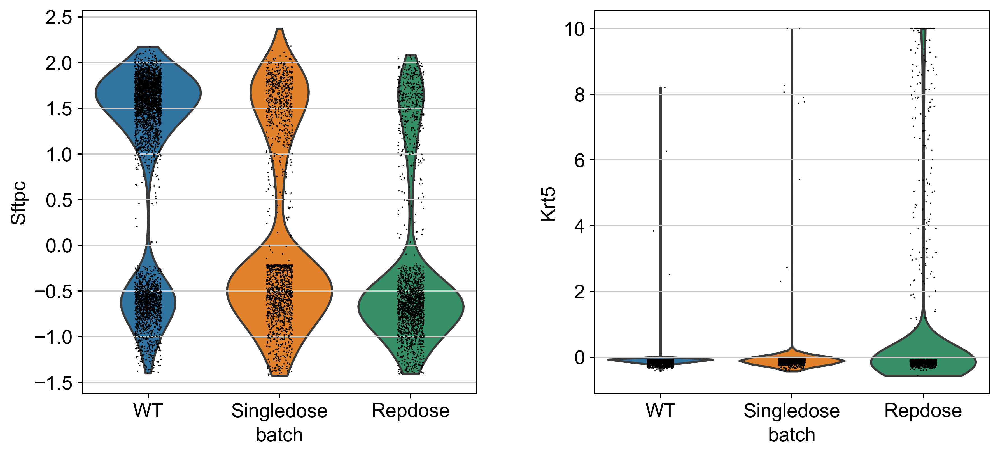

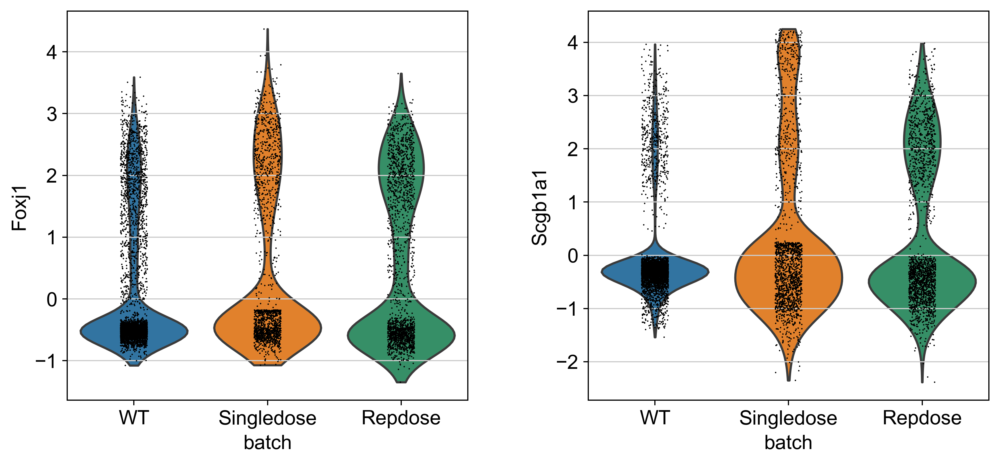

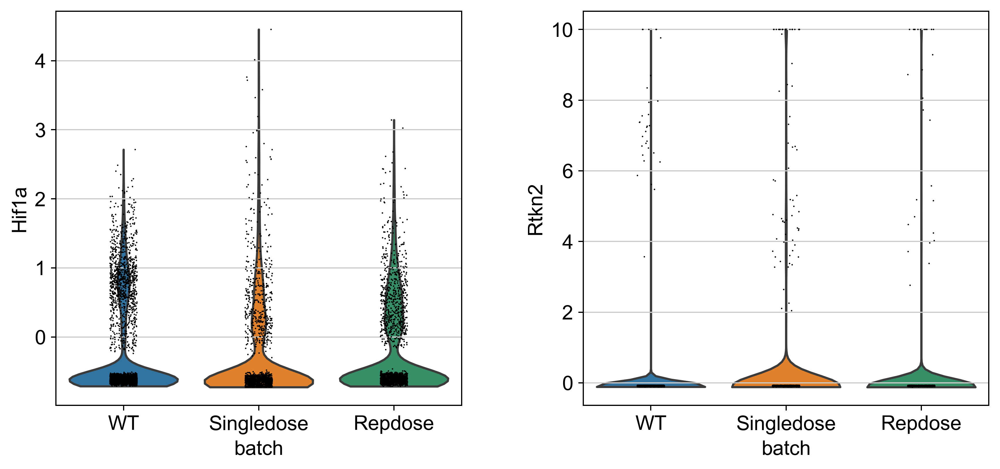

In [114]:
sc.pl.violin(epi, ['Sftpc', 'Krt5'], groupby='batch')
sc.pl.violin(epi, ['Foxj1', 'Scgb1a1'], groupby='batch')
sc.pl.violin(epi, ['Hif1a', 'Rtkn2'], groupby='batch')

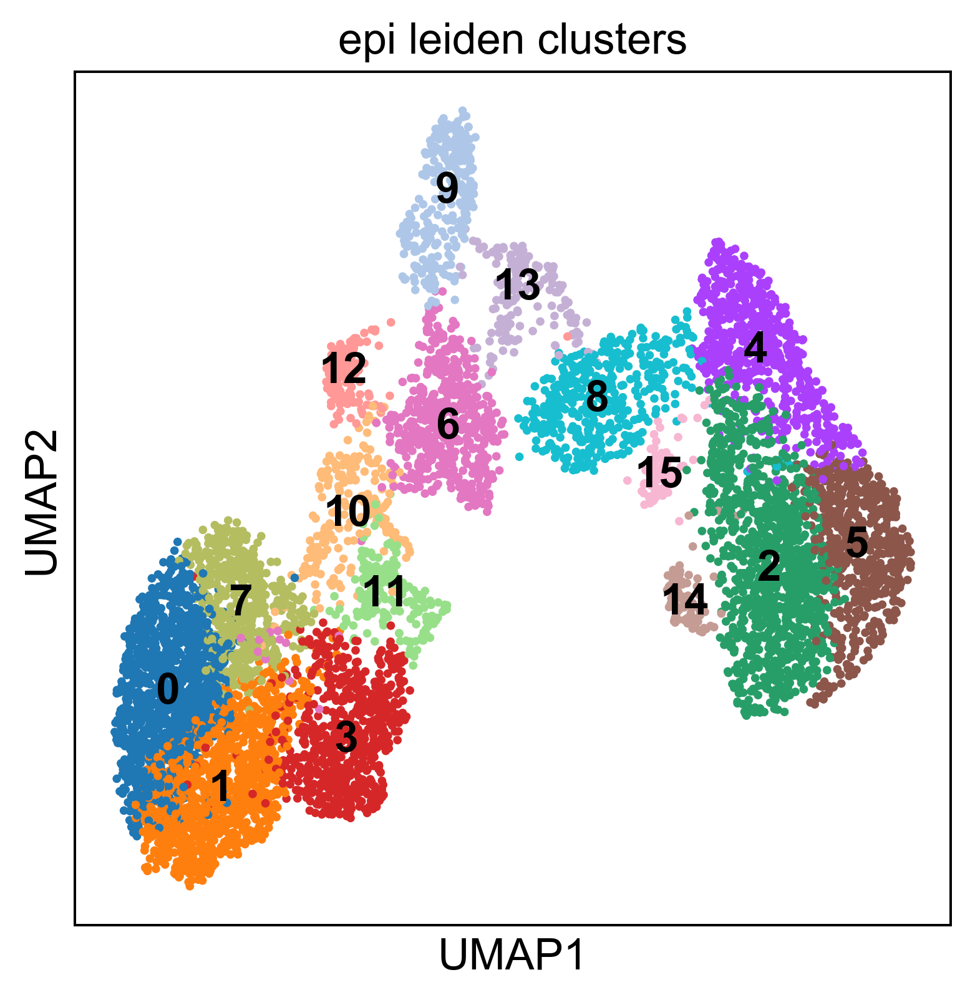

In [115]:
sc.pl.umap(epi, color=['leiden_epi_r1.0'], title='epi leiden clusters', frameon = True, s= 30, alpha = 1,legend_loc='on data', save ='_epi_leiden_clusters.pdf')

In [116]:
epi.obs['leiden_epi_r1.0']= pd.to_numeric(epi.obs['leiden_epi_r1.0'])


In [117]:
epi.obs.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7699 entries, AAACCTGCATGTCGAT-WT to TTTGTCATCTGGTTCC-Repdose
Data columns (total 9 columns):
batch                    7699 non-null category
n_genes                  7699 non-null int32
percent_mito             7699 non-null float32
n_counts                 7699 non-null float32
leiden_r1.0              7699 non-null int64
louvain_r1.0             7699 non-null category
leiden_adata_clusters    7699 non-null category
louvain_epi_r1.0         7699 non-null category
leiden_epi_r1.0          7699 non-null int64
dtypes: category(4), float32(2), int32(1), int64(2)
memory usage: 622.5+ KB


In [118]:
epi.obs['leiden_r1.0'].isnull().sum()

0

In [119]:
#Define a nice colour map for gene expression
# colors2 = plt.cm.Blues(np.linspace(0, 1, 128))
# colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
# colorsComb = np.vstack([colors3, colors2])
# mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

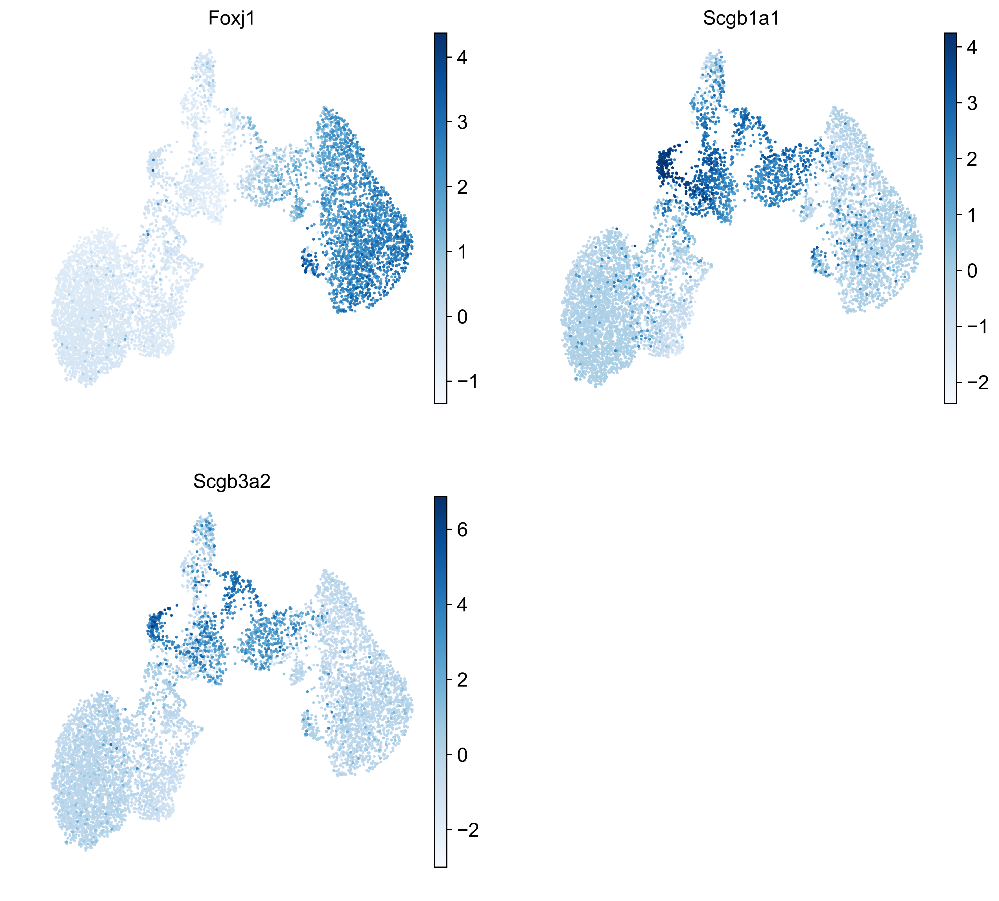

In [120]:
sc.pl.umap(epi,color =["Foxj1",'Scgb1a1','Scgb3a2'],ncols= 2,color_map = 'Blues');

In [121]:
epi.obs.loc[epi.obs['leiden_epi_r1.0'].isin([0,1,3,7,10]), 'leiden_epi_clusters']=str('Type II Pneumocytes')
epi.obs.loc[epi.obs['leiden_epi_r1.0'].isin([2,4,5,14]), 'leiden_epi_clusters']=str('Foxj1+ Ciliated Cells')
epi.obs.loc[epi.obs['leiden_epi_r1.0'].isin([9]), 'leiden_epi_clusters']=str('Krt5/Krt17/Scgb1a1/Hif1a')
epi.obs.loc[epi.obs['leiden_epi_r1.0'].isin([6]), 'leiden_epi_clusters']=str('Scgb1a1/Scgb3a2')
epi.obs.loc[epi.obs['leiden_epi_r1.0'].isin([11]), 'leiden_epi_clusters']=str('Transition cells Type II to Type I')
epi.obs.loc[epi.obs['leiden_epi_r1.0'].isin([15]), 'leiden_epi_clusters']=str('Doublets')
epi.obs.loc[epi.obs['leiden_epi_r1.0'].isin([13]), 'leiden_epi_clusters']=str('Scgb1a1/Scgb3a2/Muc5b/Bpifb1+')
epi.obs.loc[epi.obs['leiden_epi_r1.0'].isin([12]), 'leiden_epi_clusters']=str('Scgb1a1+ Hif2a')
epi.obs.loc[epi.obs['leiden_epi_r1.0'].isin([8]), 'leiden_epi_clusters']=str('Differentiating ciliated cells')
#epi.obs['leiden_epi_clusters'] = epi.obs['leiden_epi_clusters'].astype('str')

In [122]:
epi.obs.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7699 entries, AAACCTGCATGTCGAT-WT to TTTGTCATCTGGTTCC-Repdose
Data columns (total 10 columns):
batch                    7699 non-null category
n_genes                  7699 non-null int32
percent_mito             7699 non-null float32
n_counts                 7699 non-null float32
leiden_r1.0              7699 non-null int64
louvain_r1.0             7699 non-null category
leiden_adata_clusters    7699 non-null category
louvain_epi_r1.0         7699 non-null category
leiden_epi_r1.0          7699 non-null int64
leiden_epi_clusters      7699 non-null object
dtypes: category(4), float32(2), int32(1), int64(2), object(1)
memory usage: 682.6+ KB


In [123]:
epi.obs.leiden_epi_clusters.value_counts(dropna= False)

Type II Pneumocytes                   3537
Foxj1+ Ciliated Cells                 2323
Scgb1a1/Scgb3a2                        513
Differentiating ciliated cells         428
Krt5/Krt17/Scgb1a1/Hif1a               278
Transition cells Type II to Type I     201
Scgb1a1/Scgb3a2/Muc5b/Bpifb1+          170
Scgb1a1+ Hif2a                         170
Doublets                                79
Name: leiden_epi_clusters, dtype: int64

In [124]:
np.sum(epi.var['highly_variable'])

3008

... storing 'leiden_epi_clusters' as categorical


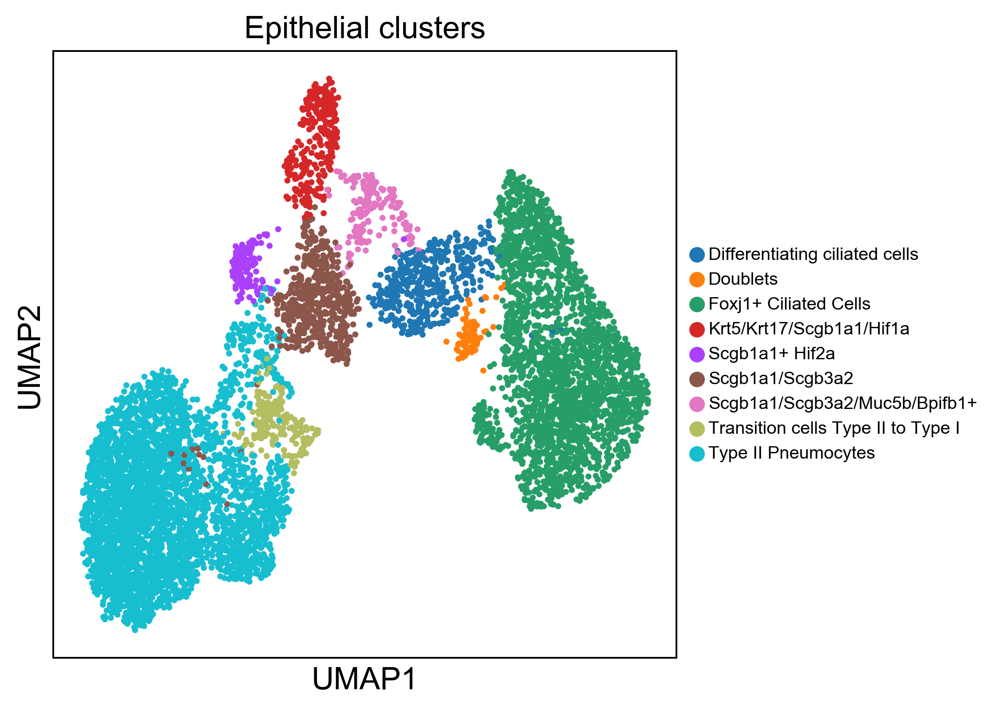

In [125]:
sc.pl.umap(epi, color=['leiden_epi_clusters'], title='Epithelial clusters', frameon = True, legend_fontsize=8, s= 30, alpha = 1,legend_loc='right margin', save='_epi_ann_clusters.pdf')

## below helps with violin plots 

In [126]:
epi.raw._varm = None

C:\Users\tanjorh\.conda\envs\singlecellanalysis\lib\site-packages\anndata\core\anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


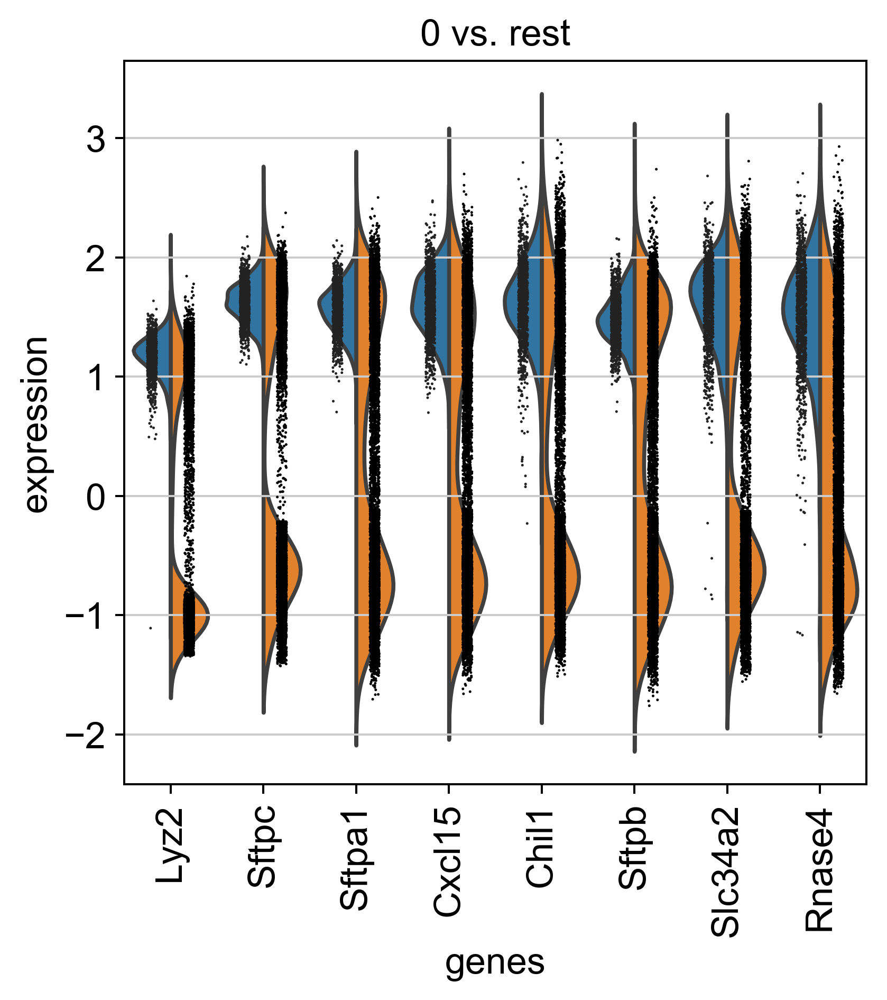

In [127]:
sc.pl.rank_genes_groups_violin(epi, groups='0', n_genes=8)

In [128]:
epi.var_names

Index(['Xkr4', 'Gm37381', 'Rp1', 'Sox17', 'Mrpl15', 'Lypla1', 'Gm37988',
       'Tcea1', 'Rgs20', 'Atp6v1h',
       ...
       'Csprs', 'AC132444.6', 'Ccl21a.1', 'AC125149.3', 'AC125149.1',
       'AC168977.2', 'AC168977.1', 'PISD', 'DHRSX', 'CAAA01147332.1'],
      dtype='object', name='index', length=19924)

In [129]:
marker_genes = ['S100a4', 'Acta2', 'Ctgf', 'Hif1a', 'Epas1', 'Cdkn2a', 
                'Wnt3a', 'Bmp4','Tgfb1', 'Ddit3', "Cyp1b1", "Dapk2","Xbp1", "Notch1", "Col1a2",'Hopx']



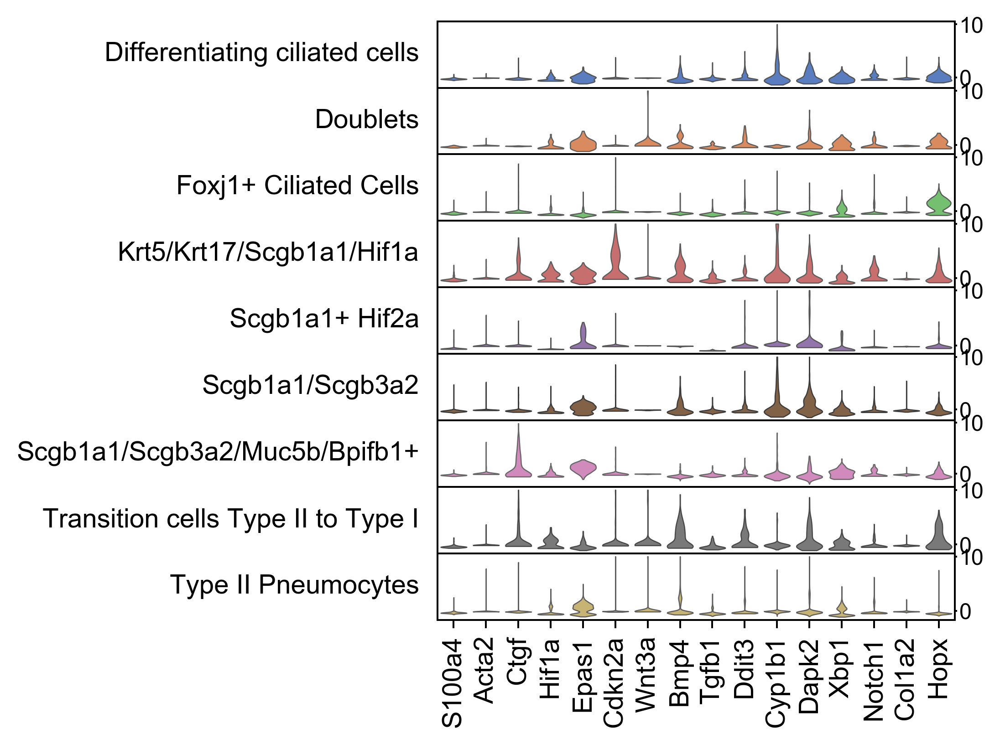

In [130]:
ax = sc.pl.stacked_violin(epi, marker_genes, groupby='leiden_epi_clusters',
                         save= "_epi_violin.pdf")

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_epi_clusters']`


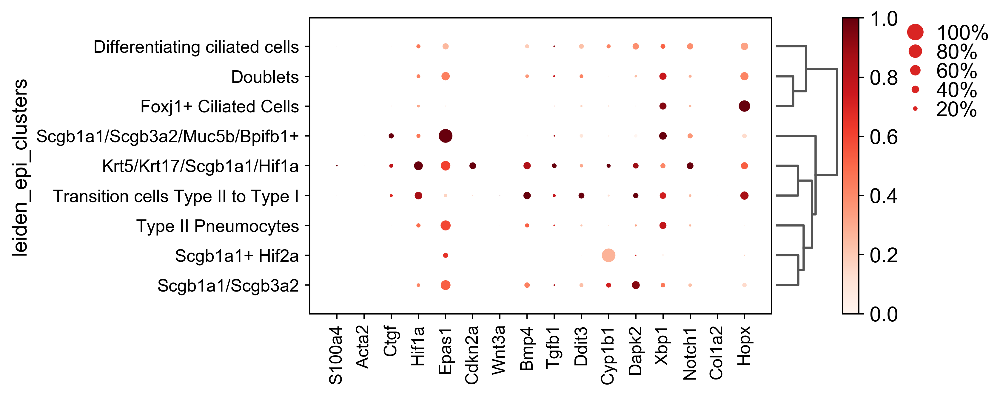

In [131]:
x = sc.pl.dotplot(epi, marker_genes, groupby='leiden_epi_clusters', dendrogram = True, standard_scale='var', save= "_epi_dot.pdf")

In [132]:
ad = epi.copy()
ad.raw.X.data = np.exp(ad.raw.X.data)

C:\Users\tanjorh\.conda\envs\singlecellanalysis\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: Assigning the 'data' attribute is an inherently unsafe operation and will be removed in the future.
  


categories: Differentiating ciliated cells, Doublets, Foxj1+ Ciliated Cells, etc.
var_group_labels: 0, 1, 2, etc.


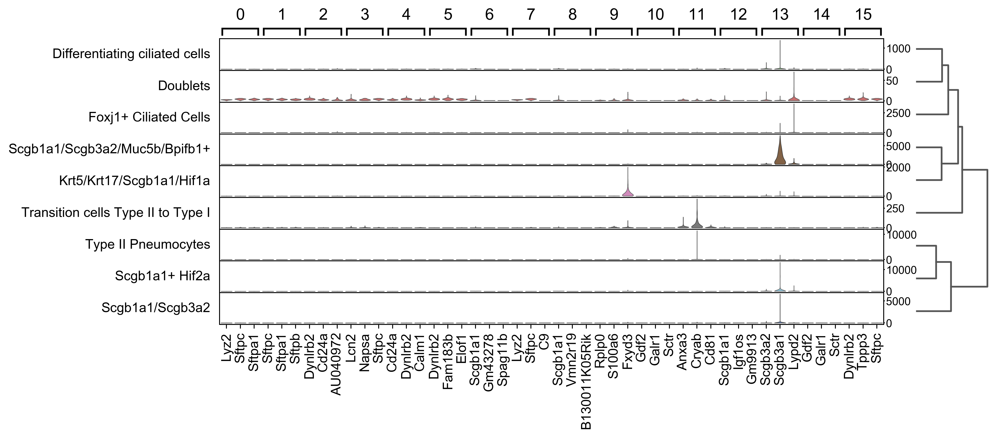

In [133]:
sc.pl.rank_genes_groups_stacked_violin(ad, n_genes=3, groupby= 'leiden_epi_clusters')

In [134]:
epi.write('../data/epi_final.h5ad')

In [ ]:
# rename_clusters = {
#     '0': 'Type II Pneumocytes',
#     '1': 'Type II Pneumocytes',
#     '3': 'Type II Pneumocytes',
#     '4': 'Type II Pneumocytes',
#     '11': 'Type II Pneumocytes',
#     '18': 'Type II Pneumocytes',
#     '2': 'Foxj1+ Ciliated cells',
#     '5': 'Foxj1+ Ciliated cells',
#     '6': 'Foxj1+ Ciliated cells',
#     '9': 'Foxj1+ Ciliated cells',
#     '16': 'Foxj1+ Ciliated cells',
#     '17': 'Foxj1+ Ciliated cells',
#     '19': 'Foxj1+ Ciliated cells',
#     '12': 'Krt5+/Krt17+ cells',
#     '18': 'Foxj1+ Ciliated cells',
#     '22': 'Foxj1+ Ciliated cells',
    
    
#  }
    
# epi.obs['leiden_epi_clusters'] = (
#      epi.obs['leiden_epi_r1.0']
#      .map(rename_clusters)
#      .astype('category')
# )
